## Testing CivitAi LoRA model
**Project summary**

*   Utilized CivitAI LoRA model - Realistic Vision V6.0 B1 based on SD 1.5 to generate images. Link: https://civitai.com/models/4201?modelVersionId=501240
*   Applied the LoRA weights from the "Realistic Vision" model to the unet component of the pipeline.
*  Custom dataset has images of hoodies,caps,tshirts and shoes

**Future Plans for model improvement**

*  We are required to significantly increase the size and diversity of our dataset by collecting more cap images
*  Is is required to experiment with various hyperparameters and prompt input to increase accuracy of the output


In [ ]:
!pip install safetensors


In [13]:
!pip install torch diffusers transformers


In [15]:
import zipfile
import os
#we unzip our folder containing 300+ basic images of caps

zip_file_path = "//content/data_all_images.zip"
extraction_path = "/content/images"
os.makedirs(extraction_path, exist_ok=True)


with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extraction_path)

In [1]:
from diffusers import StableDiffusionPipeline

# Loadding the base Stable Diffusion model
pipeline = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4")
pipeline.to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.32.1",
  "_name_or_path": "CompVis/stable-diffusion-v1-4",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [16]:
import torch
from safetensors.torch import load_file

# Loading LoRA weights for fine-tuning
lora_weights = load_file("/content/realisticVisionV60B1_v51HyperVAE.safetensors")

# Function to apply LoRA weights to the pipeline components
def apply_lora_weights(pipeline, lora_weights):
    for name, param in pipeline.unet.named_parameters():
        if name in lora_weights:
            param.data += lora_weights[name].data

apply_lora_weights(pipeline, lora_weights)


In [17]:
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import os

class CapsDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.images = os.listdir(data_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.data_dir, self.images[idx])
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image

# Define transformations for the image to dimension 256*256
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

# Running the train component
train_dataset = CapsDataset("/content/images", transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True)


  0%|          | 0/50 [00:00<?, ?it/s]

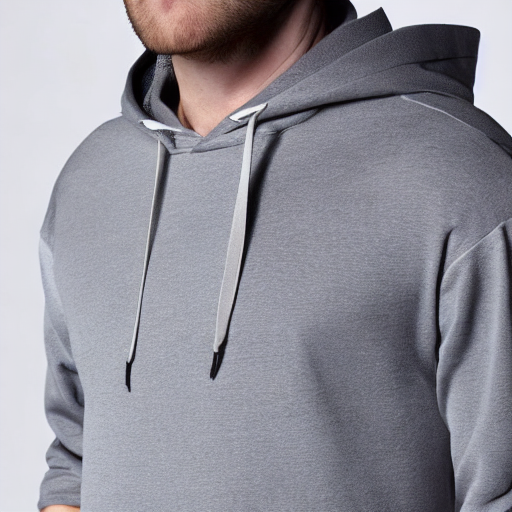

In [ ]:
# Generate a single image
generated_images = pipeline("A stylish hoodie with a modern design").images

first_image = generated_images[0]

first_image

In [ ]:
print(torch.cuda.memory_summary(device=None, abbreviated=False))

|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 2            |        cudaMalloc retries: 2         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |  14845 MiB |  14845 MiB |  19120 MiB |   4275 MiB |
|       from large pool |  14706 MiB |  14706 MiB |  18935 MiB |   4229 MiB |
|       from small pool |    138 MiB |    138 MiB |    184 MiB |     45 MiB |
|---------------------------------------------------------------------------|
| Active memory         |  14845 MiB |  14845 MiB |  19120 MiB |   4275 MiB |
|       from large pool |  14706 MiB |  14706 MiB |  18935 MiB |

In [18]:
#Generate a five image
prompt = (
    "A stylish hoodie with batman design design"
)

num_images = 5
generated_images = [pipeline(prompt).images[0] for _ in range(num_images)]



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

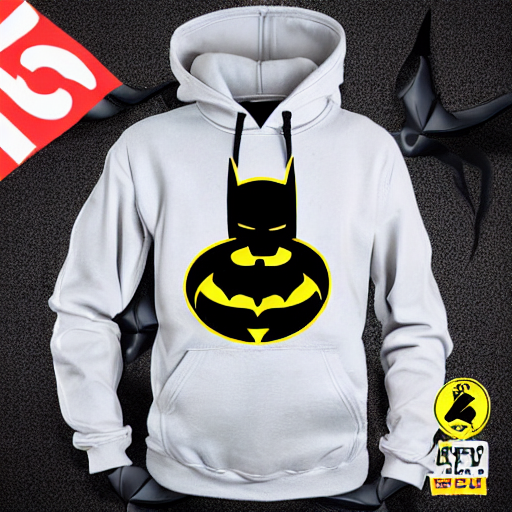

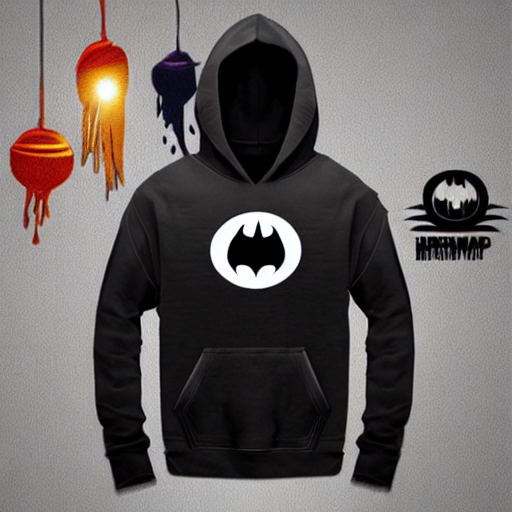

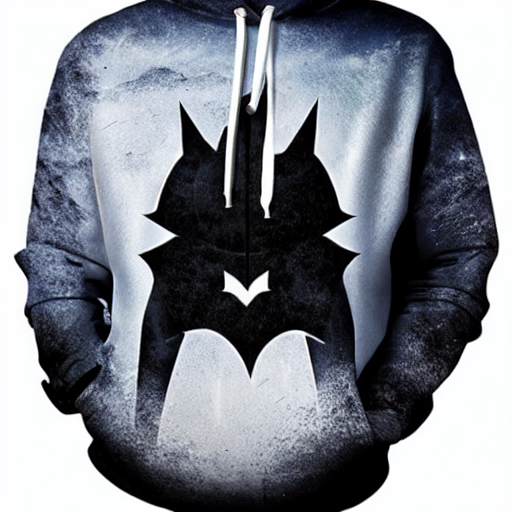

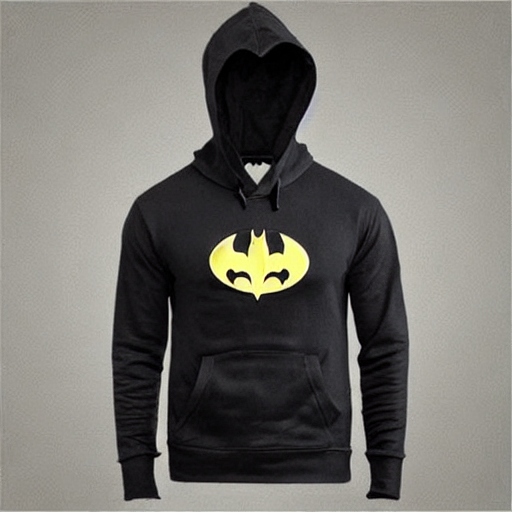

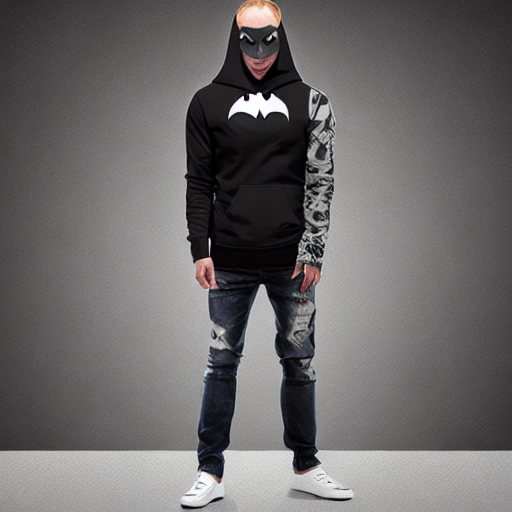

In [19]:
for img in generated_images:
    display(img)

## We have calibarated the pipeline with custom Sampling, hyper-parameter tuning and introduced negative prompt. Here, positive prompt is the user prompt.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

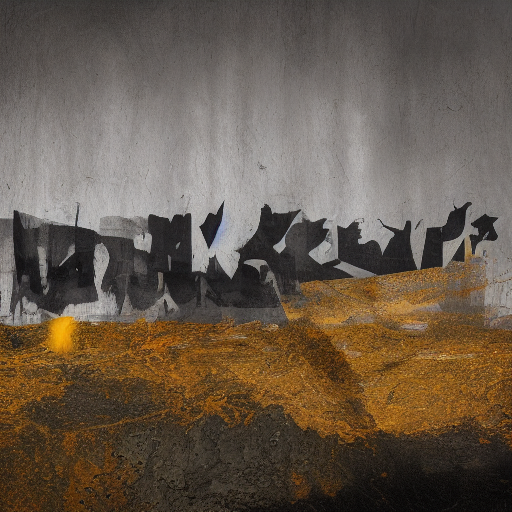

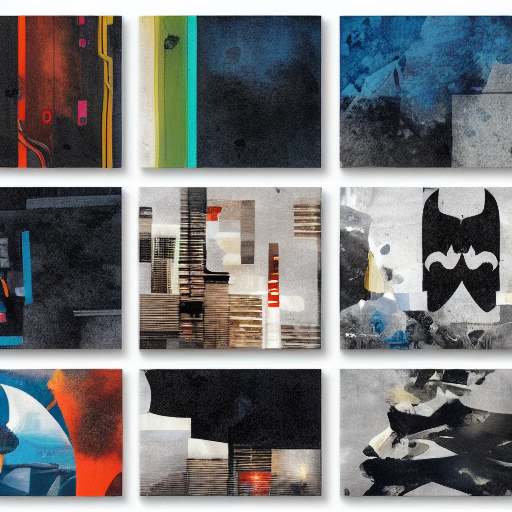

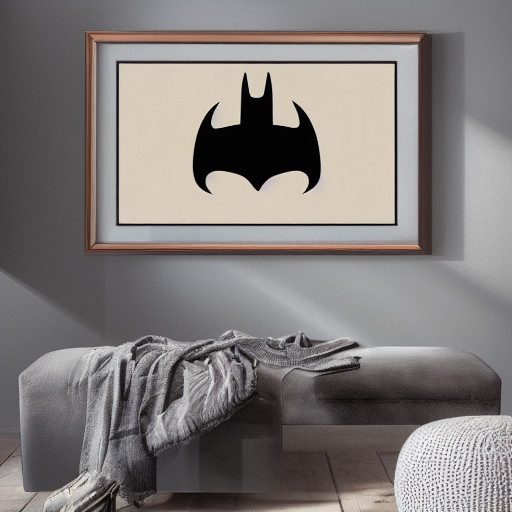

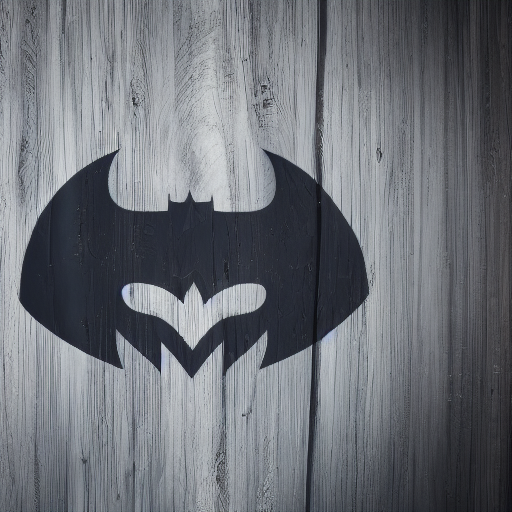

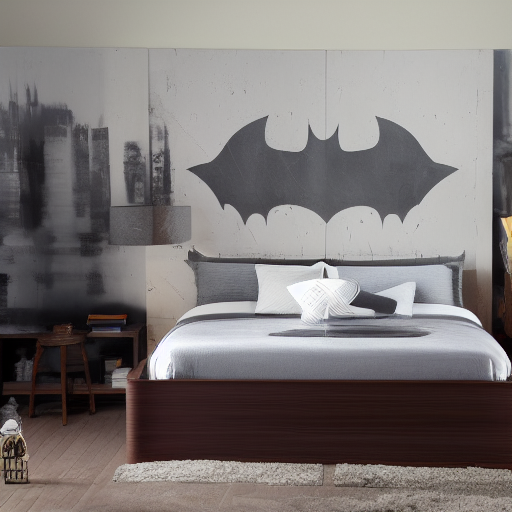

In [21]:
from diffusers import DDPMScheduler
from PIL import Image
from IPython.display import display

# Replacing with a compatible scheduler and setting the CFG scale
pipeline.scheduler = DDPMScheduler.from_config(pipeline.scheduler.config)

cfg_scale = 2.0

# Define the positive and negative prompts
positive_prompt = (
    "A stylish abstract design with batman theme, high quality, 8k uhd, dslr, soft lighting, film grain, Fujifilm XT3"

)

negative_prompt = (
    "deformed iris, deformed pupils, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime, text, cropped, out of frame, "
    "worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, extra fingers, mutated hands, poorly drawn hands, "
    "poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, bad proportions, extra limbs, cloned face, disfigured, gross proportions, "
    "malformed limbs, missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck, UnrealisticDream, "
    "mutated hands and fingers:1.4, deformed, distorted, disfigured:1.3, poorly drawn, bad anatomy, wrong anatomy, extra limb, missing limb, floating limbs, "
    "disconnected limbs, mutation, mutated, ugly, disgusting, amputation, UnrealisticDream"
)

# Generate multiple images with positive and negative prompts
def generate_images(pipeline, positive_prompt, negative_prompt, num_images=5, cfg_scale=1.7):
    try:
        generated_images = [pipeline(positive_prompt, guidance_scale=cfg_scale, negative_prompt=negative_prompt).images[0] for _ in range(num_images)]
        for img in generated_images:
            display(img)
    except Exception as e:
        print(f"An error occurred: {e}")

# Generate and display the images
generate_images(pipeline, positive_prompt, negative_prompt, num_images=5, cfg_scale=cfg_scale)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

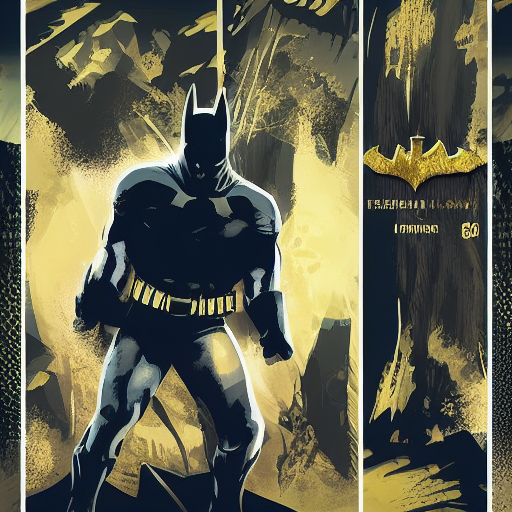

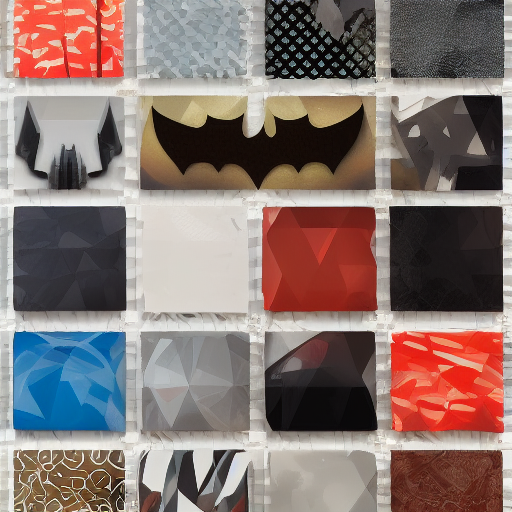

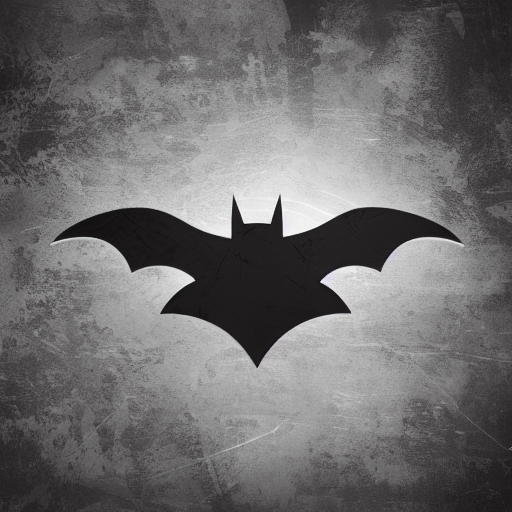

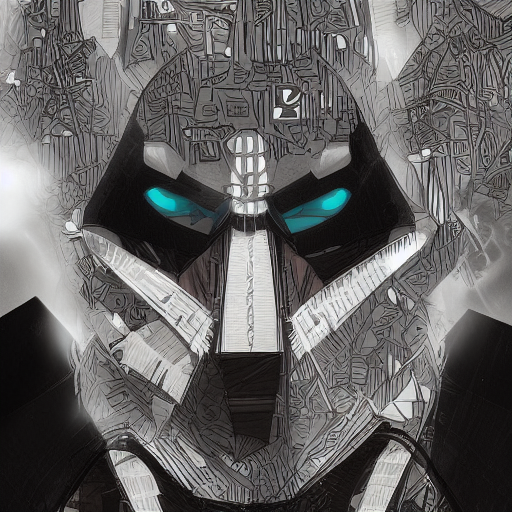

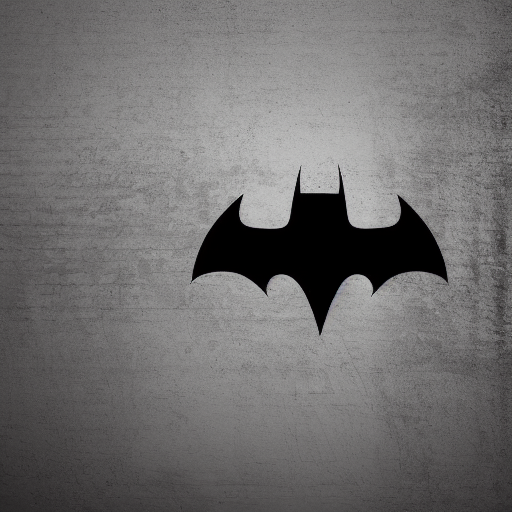

In [25]:
from diffusers import DDPMScheduler
from PIL import Image
from IPython.display import display

# Replace with a compatible scheduler and set the CFG scale
pipeline.scheduler = DDPMScheduler.from_config(pipeline.scheduler.config)

cfg_scale = 2.0

# Function to generate design images with appended instruction
def generate_designs(pipeline, user_prompt, num_images=5, cfg_scale=2.0):
    # Automatically append design instruction to the user prompt
    positive_prompt = f"{user_prompt}. Generate only stylish abstract design with similar theme, high quality, 8k uhd, dslr, soft lighting, film grain, Fujifilm XT3"

    negative_prompt = (
        "deformed iris, deformed pupils, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime, text, cropped, out of frame, "
        "worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, extra fingers, mutated hands, poorly drawn hands, "
        "poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, bad proportions, extra limbs, cloned face, disfigured, gross proportions, "
        "malformed limbs, missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck, UnrealisticDream, "
        "mutated hands and fingers:1.4, deformed, distorted, disfigured:1.3, poorly drawn, bad anatomy, wrong anatomy, extra limb, missing limb, floating limbs, "
        "disconnected limbs, mutation, mutated, ugly, disgusting, amputation, UnrealisticDream"
    )

    try:
        generated_images = [pipeline(positive_prompt, guidance_scale=cfg_scale, negative_prompt=negative_prompt).images[0] for _ in range(num_images)]
        for img in generated_images:
            display(img)
    except Exception as e:
        print(f"An error occurred: {e}")

# Example user prompt
user_prompt = "batman design"

# Generate and display the design images
generate_designs(pipeline, user_prompt, num_images=5, cfg_scale=cfg_scale)
